In [91]:
import osmnx as ox
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
import geopandas as gpd
import contextily as ctx

In [60]:
# get the street network of Canada Water. graph_from_address() enables creating a graph from OSM within some distance of a more specific address
G=ox.graph_from_address('Canada Water Station, London', dist=2000, network_type='drive')

### Plotting street network graphs

To plot the street network graph in OSMnx, you can use the `plot_graph()` function. [Click here for documentation](https://osmnx.readthedocs.io/en/stable/osmnx.html?highlight=plot_graph#osmnx.plot.plot_graph)
```python
osmnx.plot.plot_graph(G, ax=None, figsize=(8, 8), bgcolor='#111111', node_color='w', node_size=15, node_alpha=None, node_edgecolor='none', node_zorder=1, edge_color='#999999', edge_linewidth=1, edge_alpha=None, show=True, close=False, save=False, filepath=None, dpi=300, bbox=None)
```

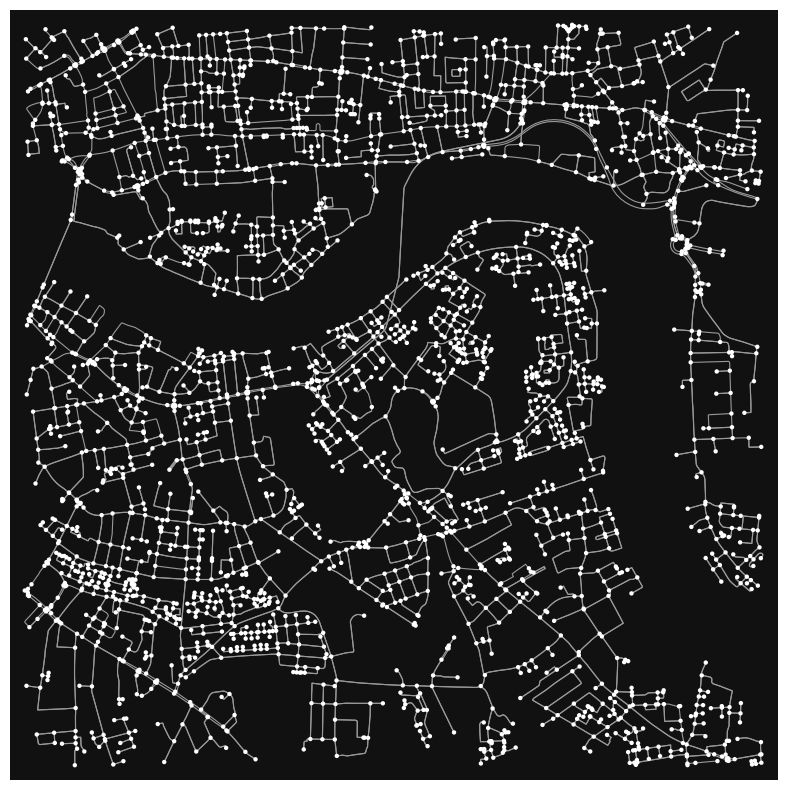

(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

In [61]:
# plot graph
ox.plot_graph(G, figsize= (10, 10), node_size = 10, edge_linewidth = 0.8)

In [92]:
# Convert the graph G to GeoDataFrames
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)

# Use the 'explore' method to create and display the map
base_map = gdf_edges.explore(color='blue', tiles = 'OpenStreetMap')

# inspect
base_map

### Street Network Basic statistics

You can calculate basic street network statistics using the `ox.basic_stats()` function. you can read more about these basic statistics at [this link](https://osmnx.readthedocs.io/en/stable/osmnx.html?highlight=basic%20stats#osmnx.stats.basic_stats). 

In [50]:
stats = ox.basic_stats(G)
stats

{'n': 2801,
 'm': 6008,
 'k_avg': 4.2898964655480185,
 'edge_length_total': 392312.83435928694,
 'edge_length_avg': 65.29840784941527,
 'streets_per_node_avg': 2.468761156729739,
 'streets_per_node_counts': {0: 0, 1: 826, 2: 66, 3: 1688, 4: 214, 5: 5, 6: 2},
 'streets_per_node_proportions': {0: 0.0,
  1: 0.2948946804712603,
  2: 0.023563013209568013,
  3: 0.6026419136022849,
  4: 0.07640128525526597,
  5: 0.001785076758300607,
  6: 0.0007140307033202428},
 'intersection_count': 1975,
 'street_length_total': 217304.03450205104,
 'street_segment_count': 3419,
 'street_length_avg': 63.55777551975754,
 'circuity_avg': 1.0649988009022255,
 'self_loop_proportion': 0.00233986545773618}

You will notice this network has `2001` nodes and `6008` edges with an average street length of `65m`, average streets per node of `2.47`. 

### Street network centrality

One of the most useful technique to analyse a street network is to calculate its centrality. The three most popular centrality measures are `Degree Centrality`, `Closeness Centrality` and `Betweenness Centrality`. The first is related to its connectivity, the second to the geometric centre of the street network and the third to street movement potential based on how likely a street is traversed on the shortest distance paths between all pairs of origins and destinations. 

While you can run these measures either at the node level or at the edge level, it is  found to be more useful to run these measures at the edge level - meaning centrality is calculated on the street. To do this, the standard primal street network is translated to its dual form in calculating edge level metric on the street.

In [63]:
# some of the centrality measures are not implemented on multiGraph so first set as diGraph
DG = ox.convert.to_digraph(G)

In [65]:
# let's first calculate its node degree centrality
node_dc = nx.degree_centrality(DG)

# after this you need to first set the attributes back to its edge
nx.set_node_attributes(DG, node_dc,'dc')

# and turn back to multiGraph for plotting
G1 = nx.MultiGraph(DG)

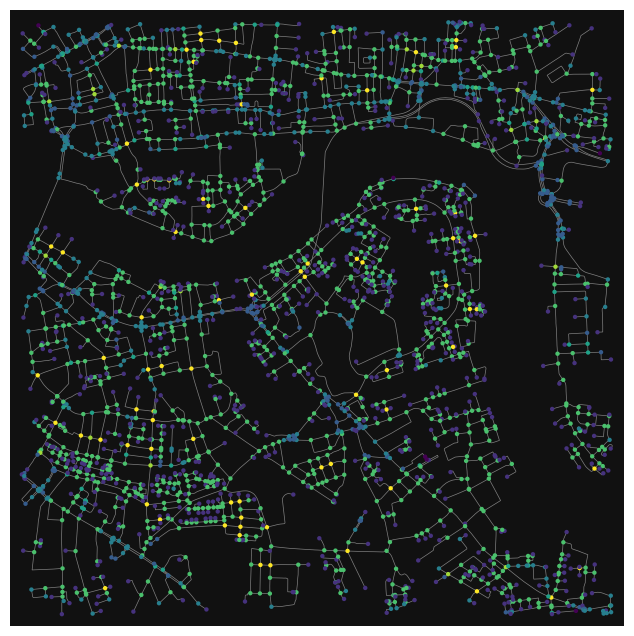

In [83]:
# you can then color the nodes in the original graph with their degree centralities 
nc = ox.plot.get_node_colors_by_attr(G1, 'dc', cmap='viridis')
fig, ax = ox.plot_graph(G1, node_size=10, node_color=nc, 
                        edge_color='gray', edge_linewidth=0.5, edge_alpha=1)

In [67]:
# you can also calculate its edge degree centrality: convert graph into a line graph so edges become nodes and vice versa
edge_dc = nx.degree_centrality(nx.line_graph(DG))

# after this you need to first set the attributes back to its edge
nx.set_edge_attributes(DG, edge_dc,'dc')

# and turn back to multiGraph for plotting
G1 = nx.MultiGraph(DG)

You could always find new colour schemes to plot the graph with and this is just one of the options that you can customise the looks of your network graph with. Google will give you some of the other options you have at your disposal for the `cmap` (or *'colourmap'*) argument.

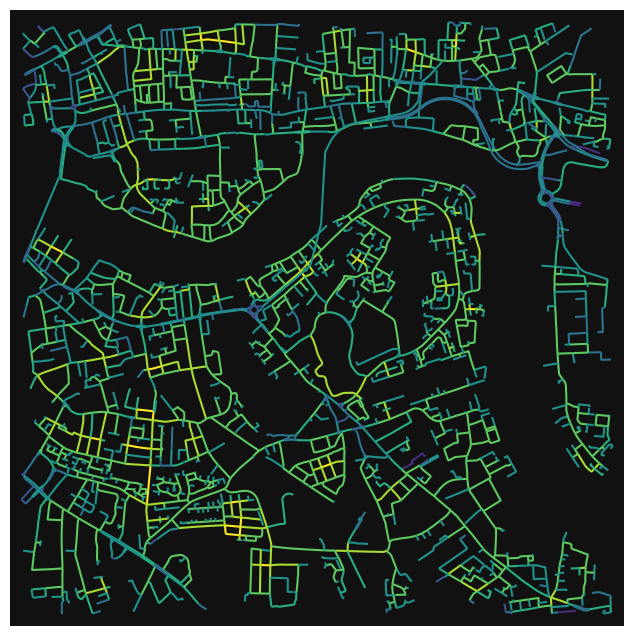

In [84]:
# you can then color the edges in the original graph with degree centralities in the line graph
nc = ox.plot.get_edge_colors_by_attr(G1, 'dc', cmap='viridis')
fig, ax = ox.plot_graph(G1, node_size=0, node_color='w', node_edgecolor='gray', node_zorder=2,
                        edge_color=nc, edge_linewidth=1.5, edge_alpha=1)

In [69]:
# similarly, let's calculate edge closeness centrality: convert graph to a line graph so edges become nodes and vice versa
edge_cc = nx.closeness_centrality(nx.line_graph(DG))

In [70]:
# set or inscribe the centrality measure of each node as an edge attribute of the graph network object
nx.set_edge_attributes(DG,edge_cc,'cc')
G1 = nx.MultiGraph(DG)

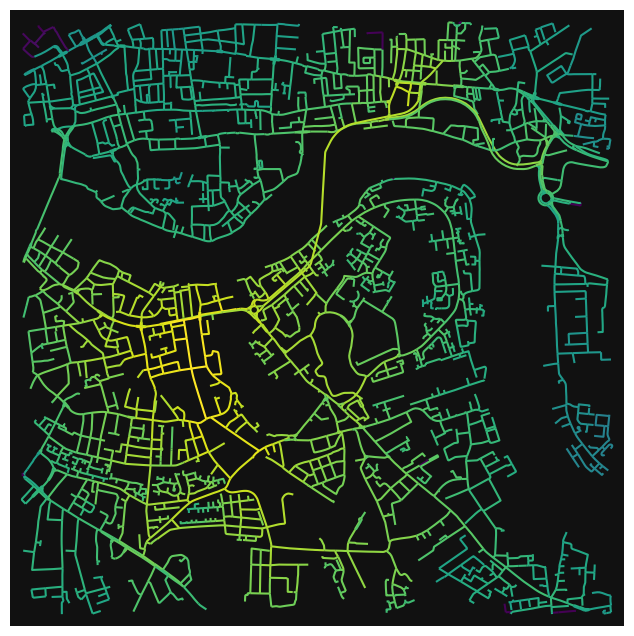

In [87]:
# you can then color the edges in the original graph with closeness centrality in the line graph. 
# you can see the area that is the most central here is near Trafalgar square.

nc = ox.plot.get_edge_colors_by_attr(G1, 'cc', cmap='viridis')
fig, ax = ox.plot_graph(G1, node_size=0, node_color='w', node_edgecolor='gray', node_zorder=2,
                        edge_color=nc, edge_linewidth=1.5, edge_alpha=1)

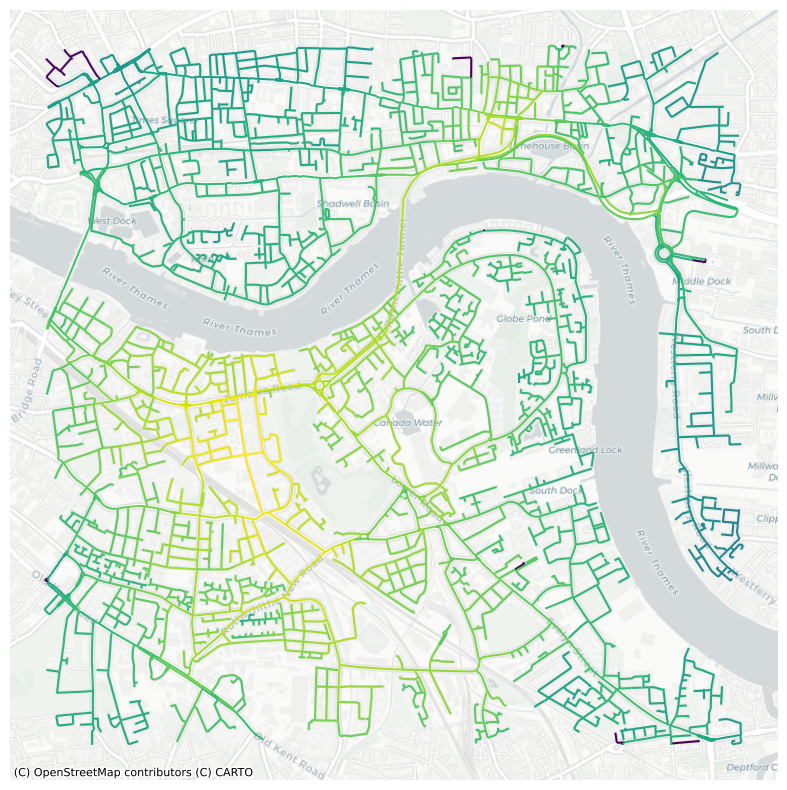

In [88]:
# convert graph to geopandas dataframe
gdf_edges = ox.graph_to_gdfs(G1,nodes=False,fill_edge_geometry=True)

# set crs to 3857 (needed for contextily)
gdf_edges = gdf_edges.to_crs(epsg=3857) # setting crs to 3857

# plot edges according to degree centrality
ax=gdf_edges.plot('cc',cmap='viridis',figsize=(10,10))

# add a basemap using contextilly
import contextily as ctx
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
plt.axis('off')
plt.show()

In [77]:
# finally, let's calculate edge betweeness centrality: please stop if this takes too long.
edge_bc = nx.betweenness_centrality(nx.line_graph(DG))

In [78]:
# set or inscribe the centrality measure of each node as an edge attribute of the graph network object
nx.set_edge_attributes(DG,edge_bc,'bc')
G1 = nx.MultiGraph(DG)

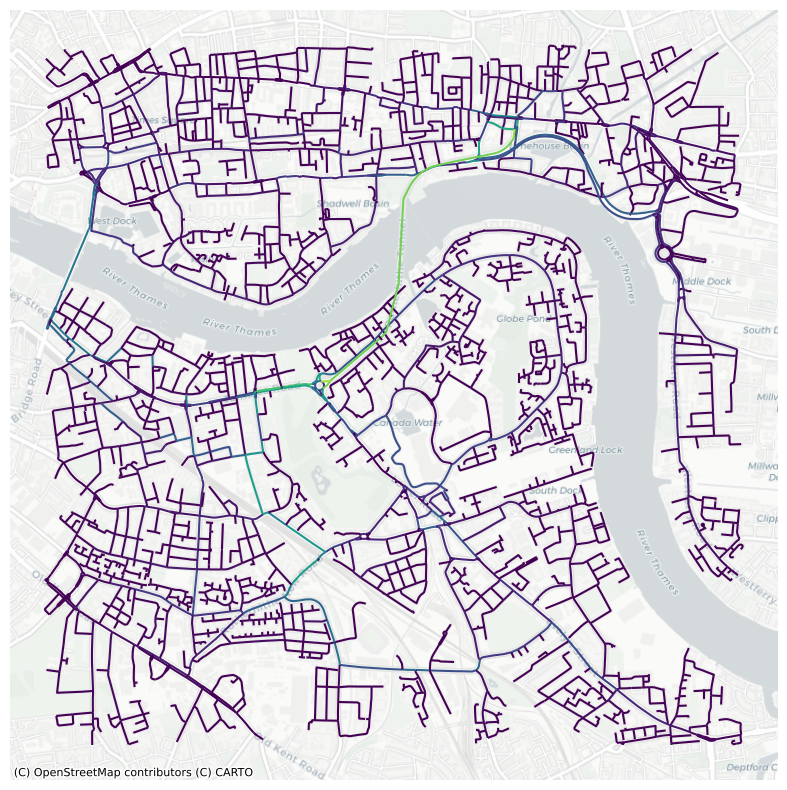

In [86]:
# convert graph to geopandas dataframe
gdf_edges = ox.graph_to_gdfs(G1,nodes=False,fill_edge_geometry=True)

# set crs to 3857 (needed for contextily)
gdf_edges = gdf_edges.to_crs(epsg=3857) # setting crs to 3857

# plot edges according to degree centrality
ax=gdf_edges.plot('bc',cmap='viridis',figsize=(10,10))

# add a basemap using contextilly
import contextily as ctx
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
plt.axis('off')
plt.show()

### Get other OpenStreetMap Geometries

One of the most recent functions in OSMnx is the `geometries` module which allows you to get other datasets from OpenStreetMaps. For example using such function allows you to plot the buildings for specific city. It is important to note, the dataset for building and land use is not as complete as the street networks dataset. 

### Plotting with Geopandas and Contextily

When combined with the package `Geopandas` and `Contextily`, you will be able to plot the centrality maps with a background of e.g. a map of the local geography. `Geopandas` is a Python package that is related to the package we learnt about in the second week, `Pandas`; it extends the functionality of data frames that `Pandas` provides us to also include the handling of **spatial data** in structured forms.

There is a separate, short notebook put up in this week that will introduce you to `GeoPandas` with a short exercise (in addition to all the materials online).


where is the geometric centre of the graph?  What you will notice is that measures such as closenss and betweenness centrality is more informative than degree for a street network?

In [121]:
# you can get the geometries of a place similar to getting a graph 
tags= tags={'landuse':True, 'building':True}
all_geom=ox.features_from_address('Canada Water Station, London', tags, dist=2000)
all_geom = all_geom.to_crs(epsg=3857)

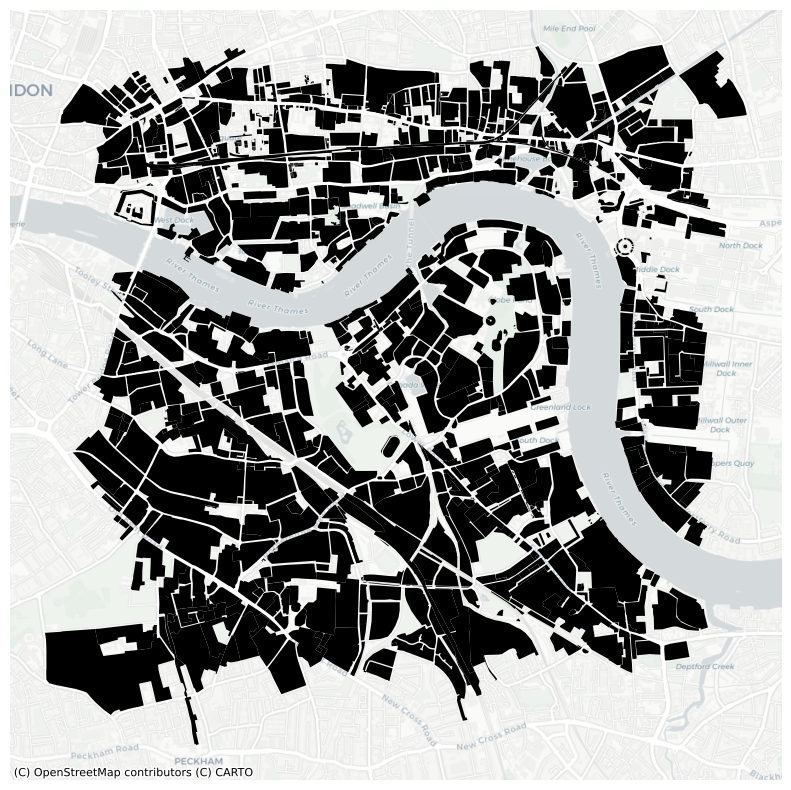

In [125]:
fig,ax = plt.subplots(figsize=(10,10))
all_geom[all_geom['landuse'].notna()].plot(ax=ax,color='black')
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
plt.axis('off')
plt.show()

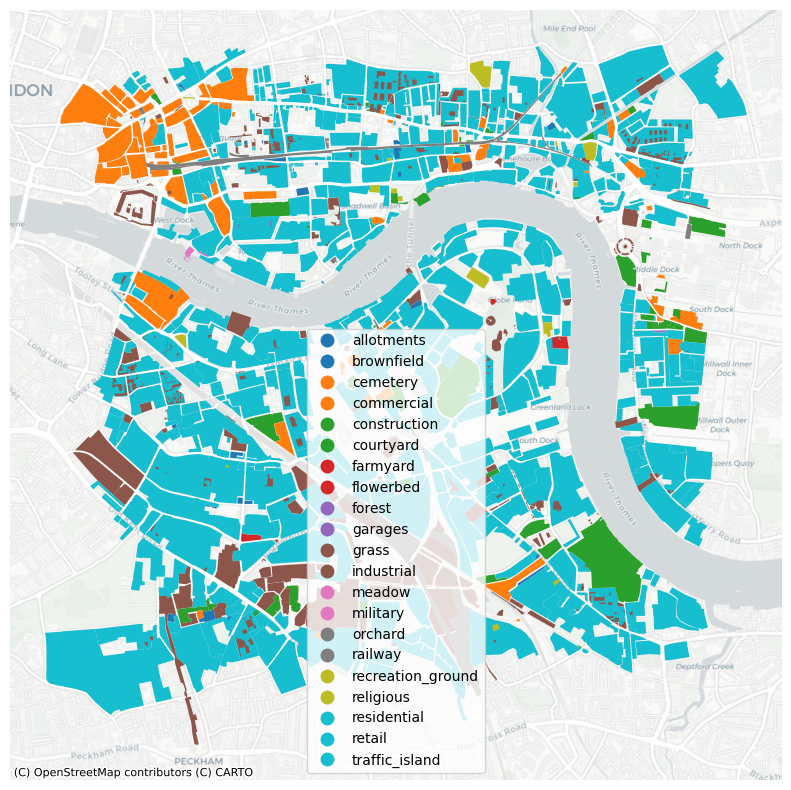

In [126]:
fig,ax = plt.subplots(figsize=(10,10))
all_geom[all_geom['landuse'].notna()].plot('landuse',
                                            ax=ax,
                                            categorical=True,
                                            legend=True)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
plt.axis('off')
plt.show()

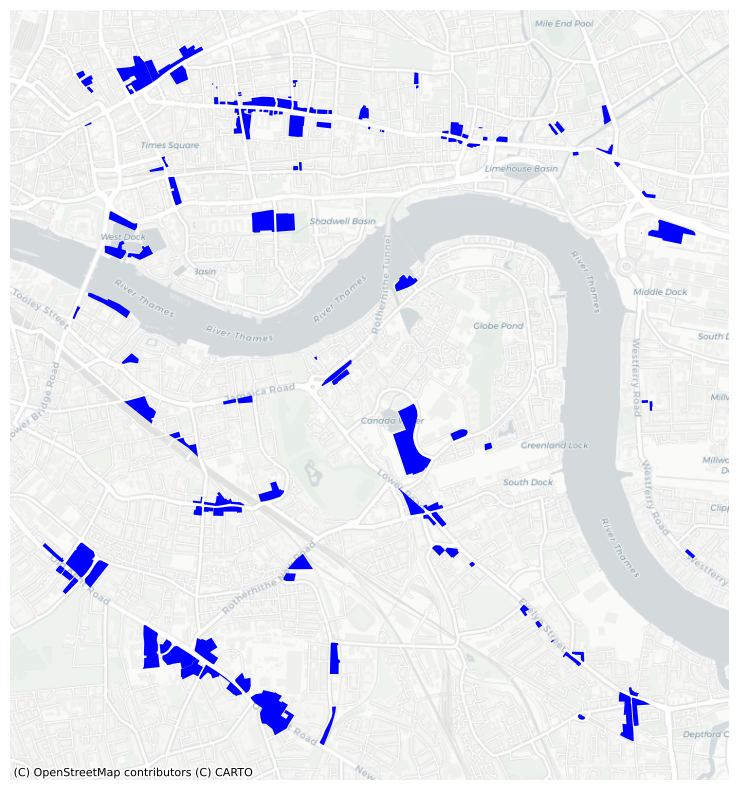

In [129]:
#isolate the `building` such as `retail'
fig,ax = plt.subplots(figsize=(10,10))
all_geom[all_geom['landuse'].notna() & all_geom['landuse'].str.contains('retail')].plot(ax=ax,color='blue')
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
plt.axis('off')
plt.show()